# COVID-19 in Italy
### Visuals of regional dynamics

In [1]:
import pandas as pd
import numpy as np 
import io
import requests
import re
import matplotlib.pyplot as plt
import datetime
from datetime import timedelta, date
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from plotly.graph_objs import Scatter, Figure, Layout
import plotly.express as px
from IPython.display import Markdown as md
init_notebook_mode(connected=False)

________________
### Italian population size by regions
To compute per capita measures we retrieve __regional population size__ from https://it.wikipedia.org/wiki/Regione_(Italia) 

In [2]:
URL='https://it.wikipedia.org/wiki/Regione_(Italia)'

res = requests.get(URL)
if res.status_code == 200:
    tables = pd.read_html(res.text)
    dt = tables[5]
else:
    print("Failed with response code: ", res.status_code)

dt2 = dt[['Regione','Popolazione (ab.)']].copy(); del dt
dt2.columns = ['region','pop']

# remove white space
dt2['pop'] = dt2['pop'].apply(lambda x: ''.join(re.findall('\d+', x))).astype(int)

dt2.head(3)    

,region,pop
0,Lombardia,9950144
1,Lazio,5706791
2,Campania,5597774


### Covid-19 data

#### Source: [this GitHubi page](https://github.com/pcm-dpc/COVID-19)
*Editore/Autore del dataset: Dipartimento della Protezione Civile. Categoria ISO 19115: Salute. Dati forniti dal Ministero della Salute.*

There are several __Regional data files__ (_Dati per Regione_) available:
>  * Struttura file giornaliero: dpc-covid19-ita-regioni-yyyymmdd.csv (dpc-covid19-ita-regioni-20200224.csv)
>  * File complessivo: dpc-covid19-ita-regioni.csv
>  * File ultimi dati (latest): dpc-covid19-ita-regioni-latest.csv

Below we use the 'dpc-covid19-ita-regioni.csv' file. First, we check the last date of entry to see when were the data updated. We then rename some of the variables to be more legible in English and merge the data frame with the Wikipedia population counts data.

&nbsp;

#### Main variable's names and description
  * hosp_with_symptoms : _# of currently hospitalized patients with symptoms_
  * int_care : _# of Patients in intensive care_
  * hosp_total: _Total number of currently hospitalized patients_
  * at_home : _# of currently at home confinement_
  * current_positive : _Total amount of current positive cases (Hospitalised patients + Home confinement)_
  * new_positives : _New amount of positive cases (Actual total amount of current positive cases - total amount of current positive cases of the previous day)_
  * total_cases : _Total amount of positive cases_
  * no_of_tests : _# of tests performed_

In [3]:
URL = 'https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni.csv'

s = requests.get(URL).content
dat = pd.read_csv(io.StringIO(s.decode('utf-8')))

print("Data updated in: {}".format(dat.data.max()))
md("All column names in the table: {}".format(dat.columns.tolist()))

Data updated in: 2023-02-09T17:00:00


All column names in the table: ['data', 'stato', 'codice_regione', 'denominazione_regione', 'lat', 'long', 'ricoverati_con_sintomi', 'terapia_intensiva', 'totale_ospedalizzati', 'isolamento_domiciliare', 'totale_positivi', 'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti', 'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening', 'totale_casi', 'tamponi', 'casi_testati', 'note', 'ingressi_terapia_intensiva', 'note_test', 'note_casi', 'totale_positivi_test_molecolare', 'totale_positivi_test_antigenico_rapido', 'tamponi_test_molecolare', 'tamponi_test_antigenico_rapido', 'codice_nuts_1', 'codice_nuts_2']

In [4]:
df = dat.drop(['stato','codice_regione'], axis=1)

df.columns = ['date','region','lat','long','hosp_with_symptoms','int_care','hosp_total','at_home','current_positive',
              'var_of_positives','new_positives','recovered', 'deaths','diagnostico','screening','total_cases',
              'no_of_tests','casi_testati','note','ingr_ter_intens','note_test','note_casi', 
              'totale_positivi_test_molecolare', 'totale_positivi_test_antigenico_rapido', 
              'tamponi_test_molecolare', 'tamponi_test_antigenico_rapido', 'codice_nuts_1', 'codice_nuts_2']

df = df.drop(['var_of_positives','diagnostico','screening','casi_testati','note','ingr_ter_intens','note_test','note_casi', 
              'totale_positivi_test_molecolare', 'totale_positivi_test_antigenico_rapido', 
              'tamponi_test_molecolare', 'tamponi_test_antigenico_rapido', 'codice_nuts_1', 'codice_nuts_2'], axis=1)

df = pd.merge(df, dt2, left_on='region', right_on='region')

df['date'] = pd.to_datetime(df['date']).dt.date
df = df.set_index(df["date"])
df.index = pd.to_datetime(df.index)

df['new_positives'] = np.abs(df['new_positives'])

df.head()

,date,region,lat,long,hosp_with_symptoms,int_care,hosp_total,at_home,current_positive,new_positives,recovered,deaths,total_cases,no_of_tests,pop
date,,,,,,,,,,,,,,,
2020-02-24,2020-02-24,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,5,1271566
2020-02-25,2020-02-25,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,5,1271566
2020-02-26,2020-02-26,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,13,1271566
2020-02-27,2020-02-27,Abruzzo,42.351222,13.398438,1,0,1,0,1,1,0,0,1,33,1271566
2020-02-28,2020-02-28,Abruzzo,42.351222,13.398438,1,0,1,0,1,0,0,0,1,33,1271566


&nbsp;

# Results
___



## Regional trends

#### Tip: double click and click on legend to select one or multiple regions in graphs.

Registration of new cases is not smoothly distributed over weekdays, e.g. weekends show lower number of new cases. In practice, use of 14-day rolling average of positive cases per 100 thousand became quite common to compare countries.

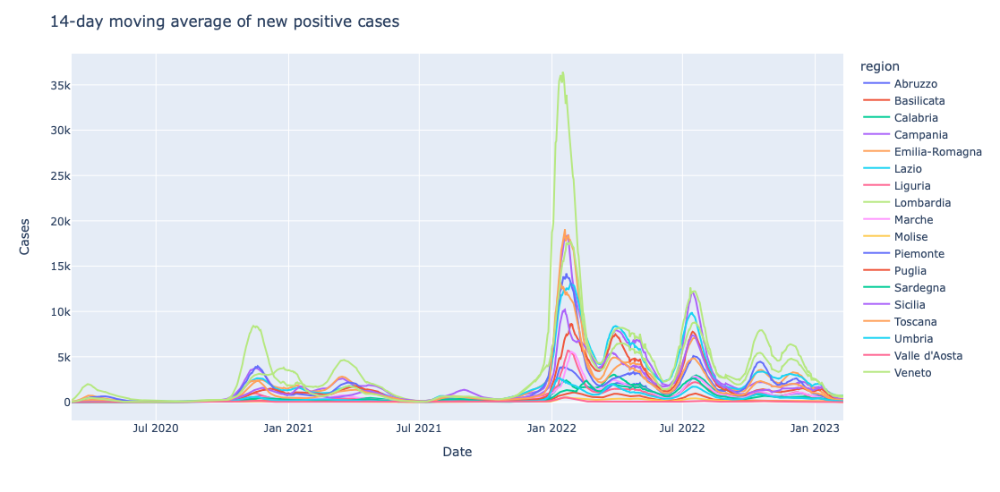

In [5]:
plt_data = df

plt_data['mov_av_7'] = plt_data['new_positives'].rolling(window=14).mean()

# plotting begins after 14 days due to rolling mean
begin_date = plt_data.index.min()+timedelta(days=10)

fig = px.line(plt_data[plt_data.index>begin_date], x='date', y='mov_av_7', 
              color='region', 
              hover_name='region',
              render_mode='svg',
              width=900, height=550)

fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Cases')
fig.update_layout(title="14-day moving average of new positive cases")
del plt_data
fig.show()

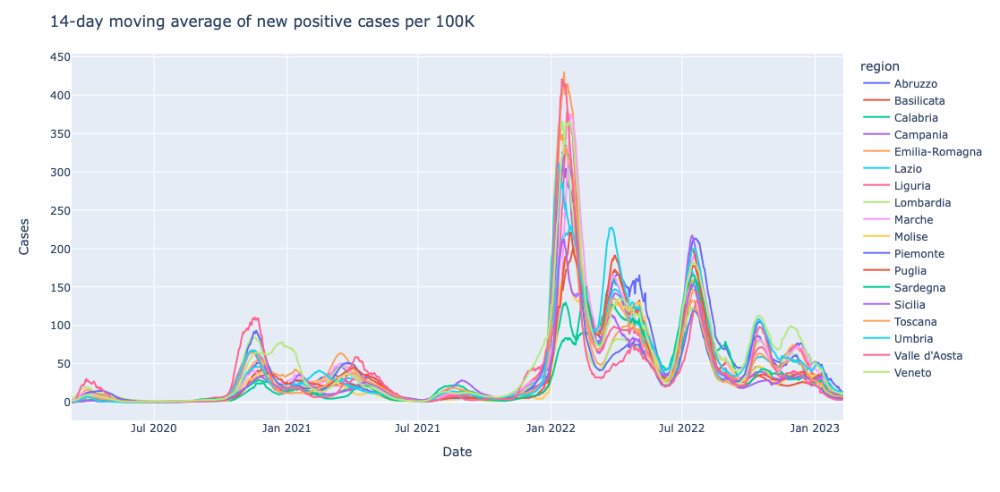

In [6]:
plt_data = df

plt_data['new_positives_per_100K'] = plt_data['new_positives']/plt_data['pop']*1000_00

plt_data['new_positives_per_100K'] = plt_data['new_positives_per_100K'].rolling(window=14).mean()

fig = px.line(plt_data[plt_data.index>'2020-3-8'], x='date', y='new_positives_per_100K', 
              color='region', 
              hover_name='region',
              render_mode='svg',
              width=900, height=550)

fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Cases')
fig.update_layout(title='14-day moving average of new positive cases per 100K')
del plt_data
fig.show()

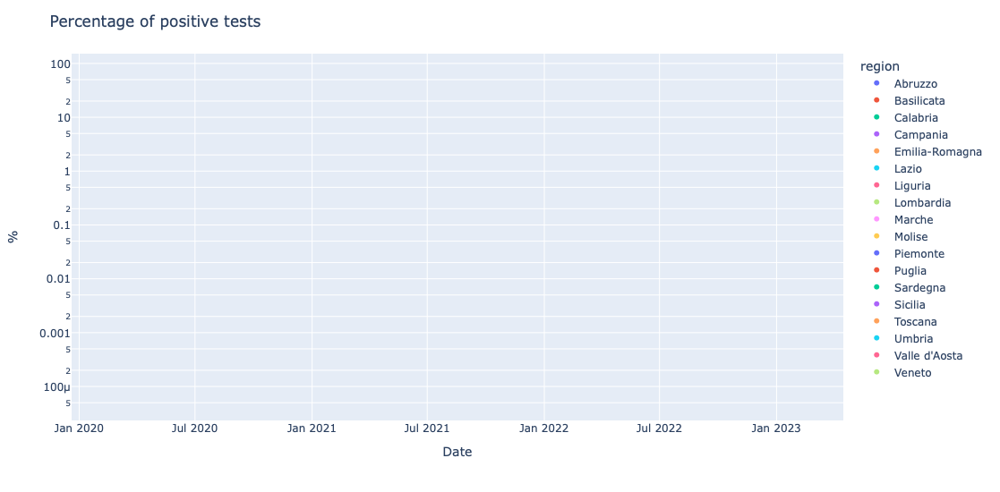

In [7]:
plt_data = df

plt_data['positive_tests'] = plt_data['new_positives']/plt_data['no_of_tests']*100

fig = px.scatter(plt_data, y='positive_tests', x='date',
                 color='region', 
                 hover_name='region',
                 log_y=True, 
                 width=900, height=550)

fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='%')
fig.update_layout(title="Percentage of positive tests")
del plt_data
fig.show()

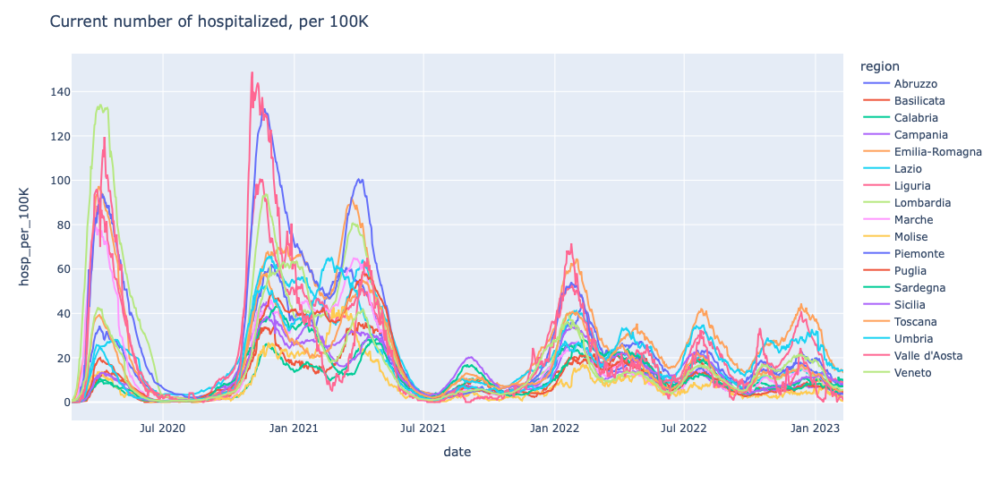

In [8]:
plt_data = df

plt_data['hosp_per_100K'] = plt_data['hosp_total']/plt_data['pop']*1000_00

fig = px.line(plt_data, x='date', y='hosp_per_100K',
              color='region',
              hover_name='region',
              render_mode="svg", 
              width=900, height=550)

fig.update_layout(title="Current number of hospitalized, per 100K")
fig.show()

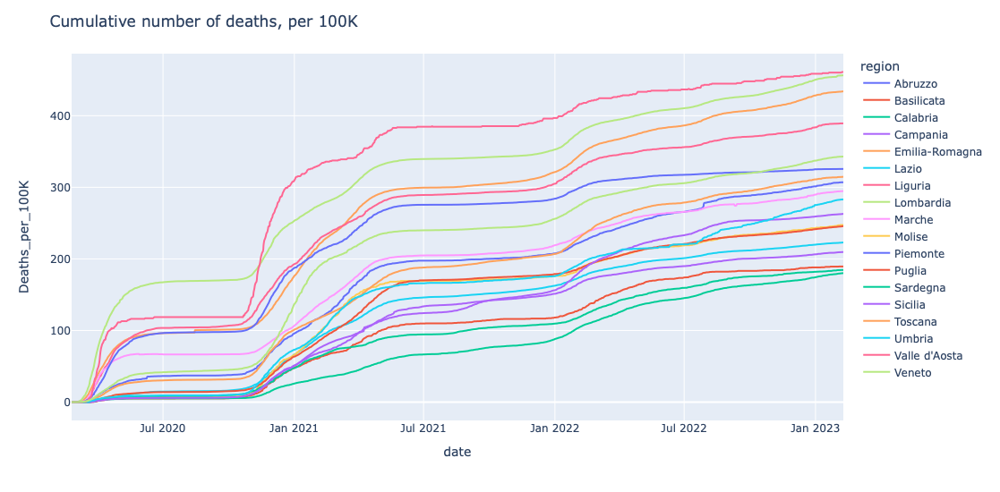

In [9]:
df2 = df

df2['Deaths_per_100K'] = (df2['deaths']/df2['pop'])*100_000

fig = px.line(df2, x="date", y="Deaths_per_100K", 
              color="region", 
              hover_name="region", 
              render_mode="svg", 
              line_shape='spline', 
              width=900, height=550)
fig.update_layout(title="Cumulative number of deaths, per 100K")
fig.show()

___

&nbsp;

## All regions together

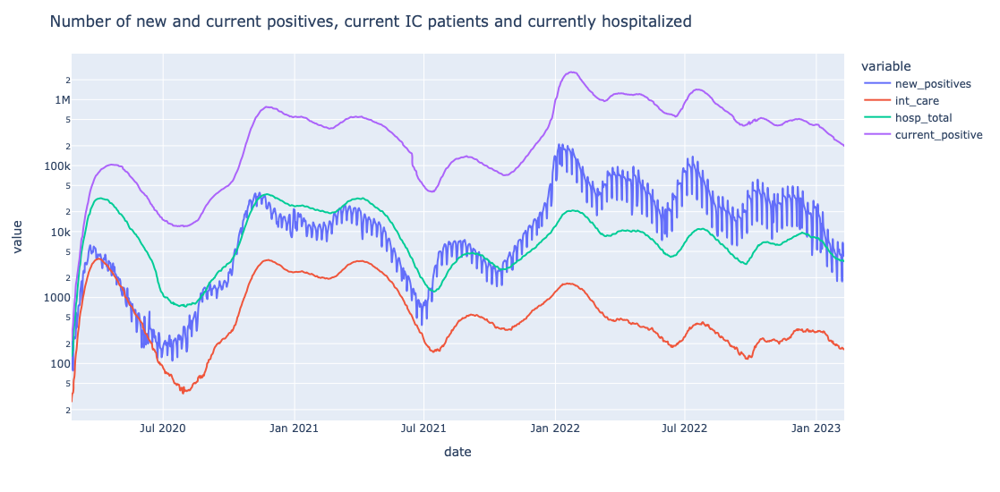

In [10]:
df2 = df

df_sum = df2.drop(['lat','long'], axis=1).groupby(df.date).sum(numeric_only=True).reset_index()

df_sum2 = pd.melt(df_sum, id_vars=['date'], 
                  value_vars=['new_positives','int_care','hosp_total','current_positive'])

fig = px.line(df_sum2, x="date", y="value", 
              color='variable', 
              hover_name="value", 
              render_mode="svg", 
              log_y=True, 
              line_shape='spline', 
              width=900, height=550)

fig.update_layout(title="Number of new and current positives, current IC patients and currently hospitalized")
fig.show()